In [50]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import roc_auc_score, make_scorer, roc_curve, auc, confusion_matrix
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.decomposition import TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE
from tensorflow.keras.utils import to_categorical
from itertools import cycle
import pymorphy2
from string import punctuation
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\chugu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
df = pd.read_csv("Corona_NLP_train.csv", encoding='latin1')
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


In [58]:
test_df = pd.read_csv("Corona_NLP_test.csv", encoding='latin1')
test_df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral


In [4]:
df = df.drop(["UserName", "ScreenName", "Location", "TweetAt"], axis=1)
df.head()

,OriginalTweet,Sentiment
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,advice Talk to your neighbours family to excha...,Positive
2,Coronavirus Australia: Woolworths to give elde...,Positive
3,My food stock is not the only one which is emp...,Positive
4,"Me, ready to go at supermarket during the #COV...",Extremely Negative


In [59]:
test_df = test_df.drop(["UserName", "ScreenName", "Location", "TweetAt"], axis=1)
test_df.head()

,OriginalTweet,Sentiment
0,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative
1,When I couldn't find hand sanitizer at Fred Me...,Positive
2,Find out how you can protect yourself and love...,Extremely Positive
3,#Panic buying hits #NewYork City as anxious sh...,Negative
4,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral


<AxesSubplot:>

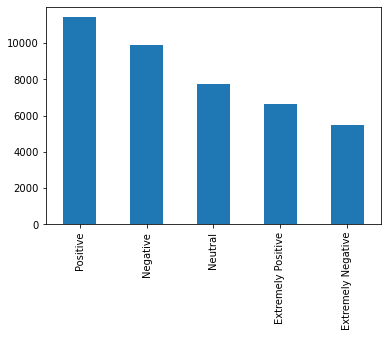

In [5]:
df["Sentiment"].value_counts().plot.bar()

<AxesSubplot:>

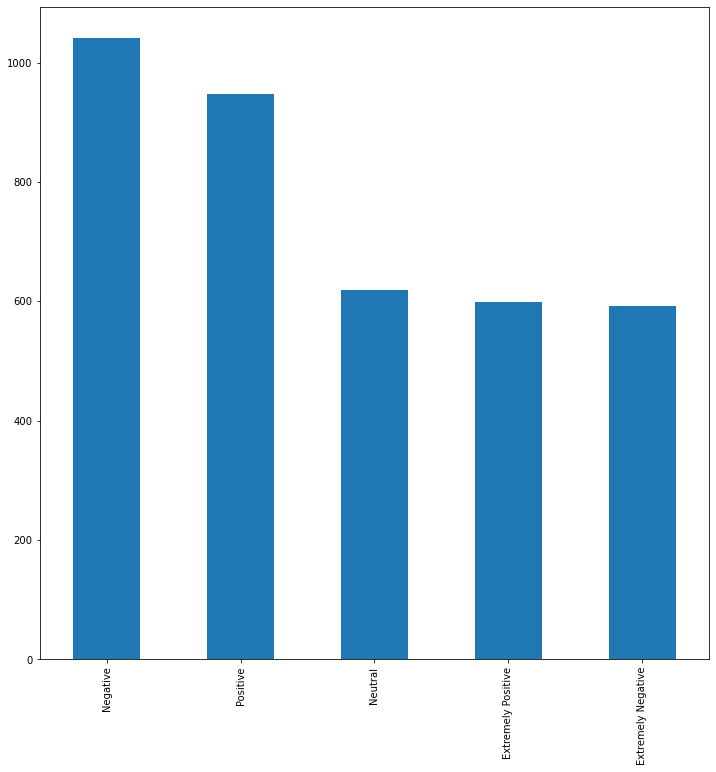

In [60]:
test_df["Sentiment"].value_counts().plot.bar()

In [13]:
morph = pymorphy2.MorphAnalyzer()
eng_stopwords = stopwords.words("english")

def text_preprocess(text):
    tokens = text.lower().split()
    tokens = [morph.parse(token)[0].normal_form for token in tokens if token not in eng_stopwords\
              and token != " " \
              and token.strip() not in punctuation]
    text = " ".join(tokens)
    return text

for i, item in df.iterrows():
    text = item["OriginalTweet"]
    text = text_preprocess(text)
    df.at[i, "OriginalTweet"] = text

In [15]:
tfidf = TfidfVectorizer(max_features=1000)
train_data = tfidf.fit_transform(df["OriginalTweet"])

In [16]:
encoder = LabelEncoder()
y = encoder.fit_transform(df["Sentiment"])

In [57]:
encoder.inverse_transform([2])

array(['Negative'], dtype=object)

In [17]:
forest = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
fold = StratifiedKFold()

cross_val_score(forest, train_data, y, cv=fold, n_jobs=-1, scoring="accuracy")

array([0.4818999 , 0.49161808, 0.48645365, 0.47989309, 0.49204228])

In [18]:
bayes = MultinomialNB()
fold = StratifiedKFold()

cross_val_score(bayes, train_data, y, cv=fold, n_jobs=-1, scoring="accuracy")

array([0.44557823, 0.45833333, 0.44599684, 0.443567  , 0.44879116])

In [30]:
smoteen = SMOTEENN(random_state=42, n_jobs=-1)
train_smoteen_x, y_smoteen = smoteen.fit_resample(train_data, y)

<AxesSubplot:>

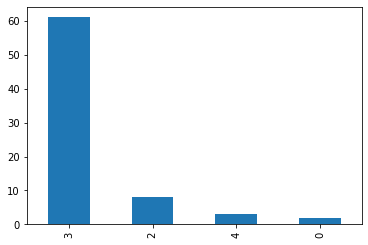

In [39]:
pd.Series(y_smoteen).value_counts().plot.bar()

In [27]:
smotomek = SMOTETomek(random_state=42, n_jobs=-1)
train_smotomek_x, y_smotomek = smotomek.fit_resample(train_data, y)

<AxesSubplot:>

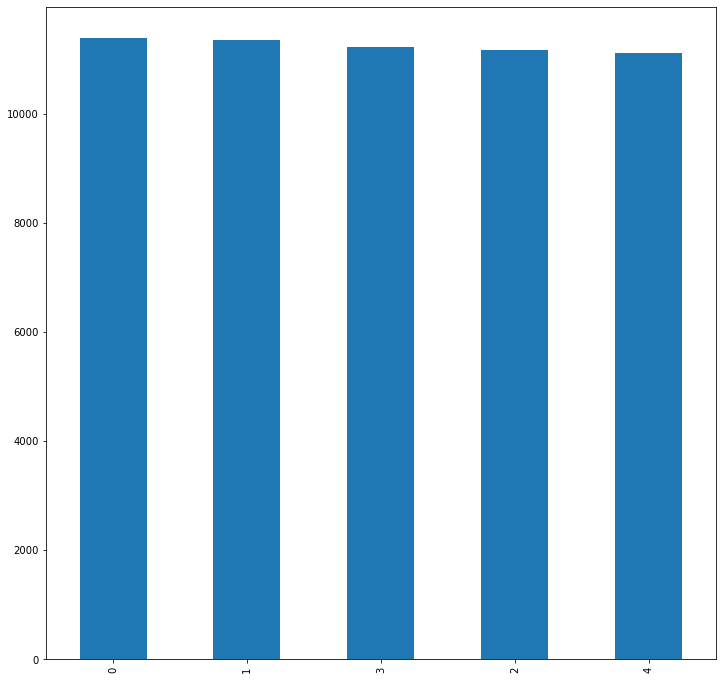

In [52]:
pd.Series(y_smotomek).value_counts().plot.bar()

In [28]:
bayes = MultinomialNB()
fold = StratifiedKFold()

cross_val_score(bayes, train_smotomek_x, y_smotomek, cv=fold, n_jobs=-1, scoring="accuracy")

array([0.48627033, 0.45667822, 0.50488802, 0.54301458, 0.52746178])

In [29]:
bayes = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
fold = StratifiedKFold()

cross_val_score(bayes, train_smotomek_x, y_smotomek, cv=fold, n_jobs=-1, scoring="accuracy")

array([0.55665156, 0.54883142, 0.60282616, 0.69018841, 0.69267686])

In [ ]:
tsn = TSNE(100, )
data = tsn.fit_transform(train_smotomek_x)

In [59]:
tsn = TSNE()
data = tsn.fit_transform(train_smotomek_x)

bayes = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
fold = StratifiedKFold()

cross_val_score(bayes, data, y_smotomek, cv=fold, n_jobs=-1, scoring="accuracy")

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


array([0.54863154, 0.54105376, 0.57132668, 0.64434736, 0.7024786 ])

<AxesSubplot:>

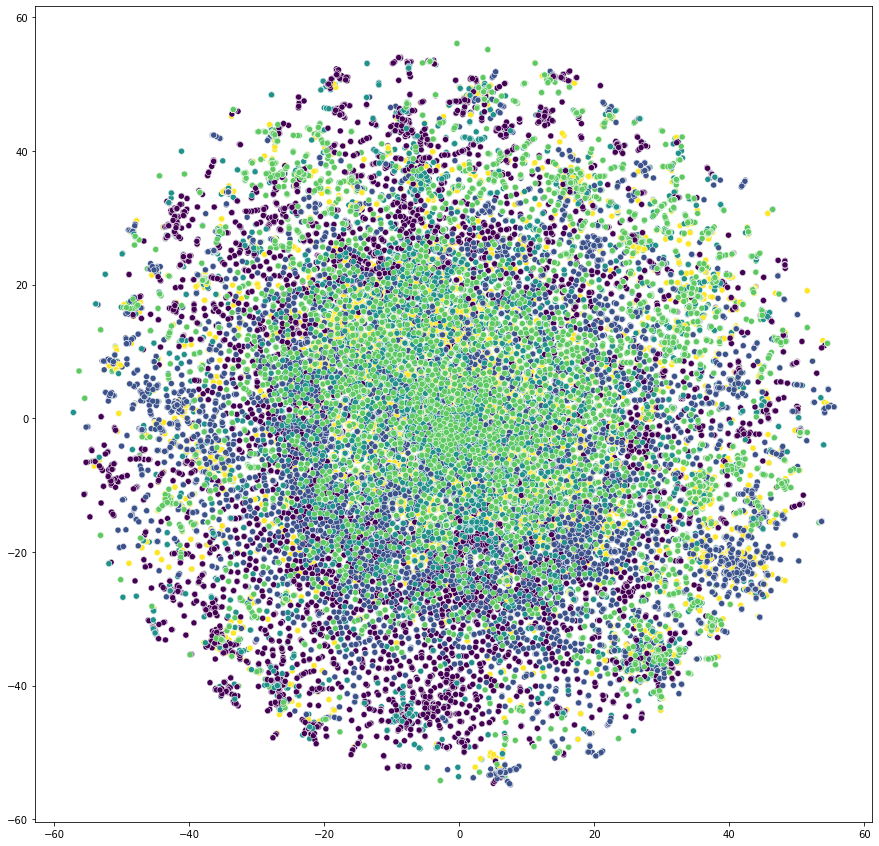

In [64]:
fig_dims = (15, 15)
fig, ax = plt.subplots(figsize=fig_dims)

sns.scatterplot(x=data[:, 0], y=data[:, 1], ax=ax, c=y_smotomek)

In [79]:
tsn = TSNE(3)
d3ata = tsn.fit_transform(train_smotomek_x)

marker_data = go.Scatter3d(
    x=d3ata[:, 0], 
    y=d3ata[:, 1], 
    z=d3ata[:, 2],  
    opacity=0.8, 
    mode='markers',
    marker={
        "color": y_smotomek,
        "size": 3
    }
)
fig=go.Figure(data=marker_data)
fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [30]:
fold = StratifiedKFold()
score = []
estimators = []
y_local = to_categorical(y_smotomek)

for train_index, test_index in fold.split(train_smotomek_x, y_smotomek):
    forest = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
    forest.fit(train_smotomek_x[train_index], y_smotomek[train_index])
    results = roc_auc_score(y_local[test_index], to_categorical(forest.predict(train_smotomek_x[test_index])), multi_class="ovr")
    score.append(results)
    estimators.append(forest)
score, np.mean(score)

[0.722478822961113,
 0.7175901836589047,
 0.7511120875209257,
 0.8051852760656626,
 0.8066736099698838]

In [46]:
svd = TruncatedSVD(750, random_state=42)
data = svd.fit_transform(train_smotomek_x)

In [47]:
fold = StratifiedKFold()
score = []
estimators = []
y_local = to_categorical(y_smotomek)

for train_index, test_index in fold.split(data, y_smotomek):
    forest = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
    forest.fit(data[train_index], y_smotomek[train_index])
    results = roc_auc_score(y_local[test_index], to_categorical(forest.predict(data[test_index])), multi_class="ovr")
    score.append(results)
    estimators.append(forest)
score, np.mean(score)

[0.7096575940380948,
 0.7080272690436773,
 0.7258163803491559,
 0.7884912562525661,
 0.8109509421062484]

In [48]:
predicts = to_categorical(forest.predict(data[test_index]))
yt_tc = y_local[test_index]
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(yt_tc[:, i], predicts[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(yt_tc.ravel(), predicts.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

<Figure size 1332x756 with 0 Axes>

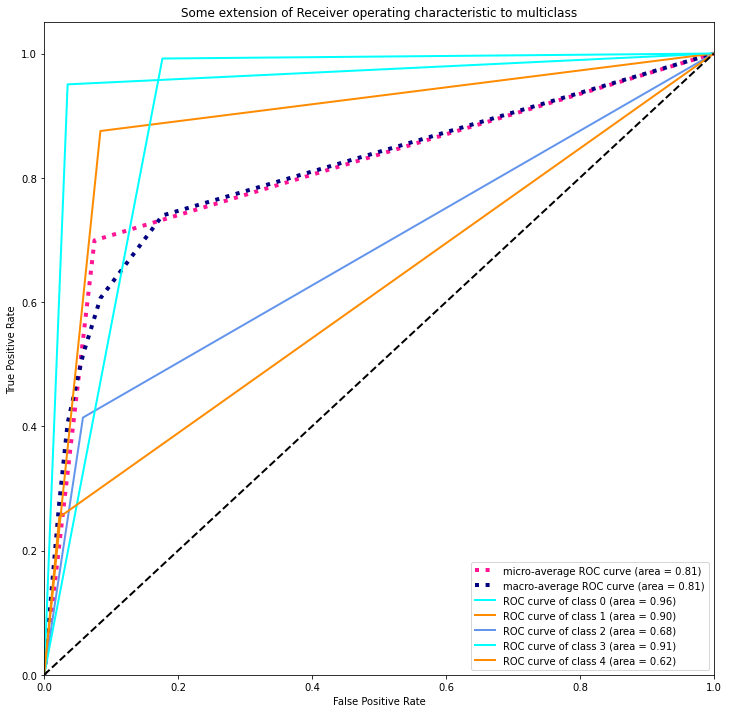

In [49]:
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.rcParams["figure.figsize"] = (12,12)
lw = 2

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(5)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(5):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= 5

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(5), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=lw,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )
plt.plot([0, 1], [0, 1], "k--", lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

<AxesSubplot:>

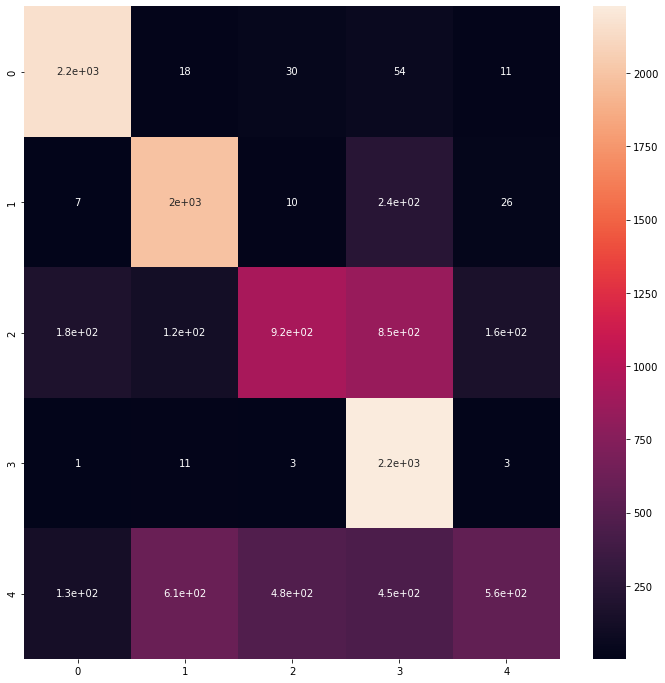

In [51]:
cf_matrix = confusion_matrix(y_smotomek[test_index], forest.predict(data[test_index]))
sns.heatmap(cf_matrix, annot=True)

In [61]:
y_test = encoder.transform(test_df["Sentiment"])
y_test

array([0, 4, 1, ..., 3, 0, 1])

In [62]:
for i, item in test_df.iterrows():
    text = item["OriginalTweet"]
    text = text_preprocess(text)
    test_df.at[i, "OriginalTweet"] = text

x_test = tfidf.transform(test_df["OriginalTweet"])
x_test = svd.transform(x_test)

In [ ]:
forest = RandomForestClassifier(n_estimators=150, n_jobs=-1, random_state=42)
forest.fit(data, y_smotomek)

roc_auc_score(to_categorical(y_test), to_categorical(forest.predict(x_test)), multi_class="ovr")